##  Problem Statement 

For a film production company, the success of the film is closely determined by the IMDB ratings the
movie receives. More often than not, the IMDB rating is influenced by the factors more than the
story/script like the cast of the film, the director of the film, social media popularity etc. Your task is to
create a model to predict the IMDB rating of a film before it is released.

# Importing the libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from pandas_profiling import ProfileReport # pip install pandas-profiling[notebook]
import matplotlib.pyplot as plt

# Importing the dataset

In [2]:
dataset = pd.read_csv('movie_metadata.csv')
dataset.shape

(5043, 28)

# Getting columns with categorical data and numerical data

In [3]:
#Getting columns with categorical data and numerical data
num_cols = [col for col in dataset.columns if dataset[col].dtype != 'object']
char_cols = [col for col in dataset.columns if dataset[col].dtype == 'object']
num_cols, char_cols

(['num_critic_for_reviews',
  'duration',
  'director_facebook_likes',
  'actor_3_facebook_likes',
  'actor_1_facebook_likes',
  'gross',
  'num_voted_users',
  'cast_total_facebook_likes',
  'facenumber_in_poster',
  'num_user_for_reviews',
  'budget',
  'title_year',
  'actor_2_facebook_likes',
  'imdb_score',
  'aspect_ratio',
  'movie_facebook_likes'],
 ['color',
  'director_name',
  'actor_2_name',
  'genres',
  'actor_1_name',
  'movie_title',
  'actor_3_name',
  'plot_keywords',
  'movie_imdb_link',
  'language',
  'country',
  'content_rating'])

# Generating correlational matrix 

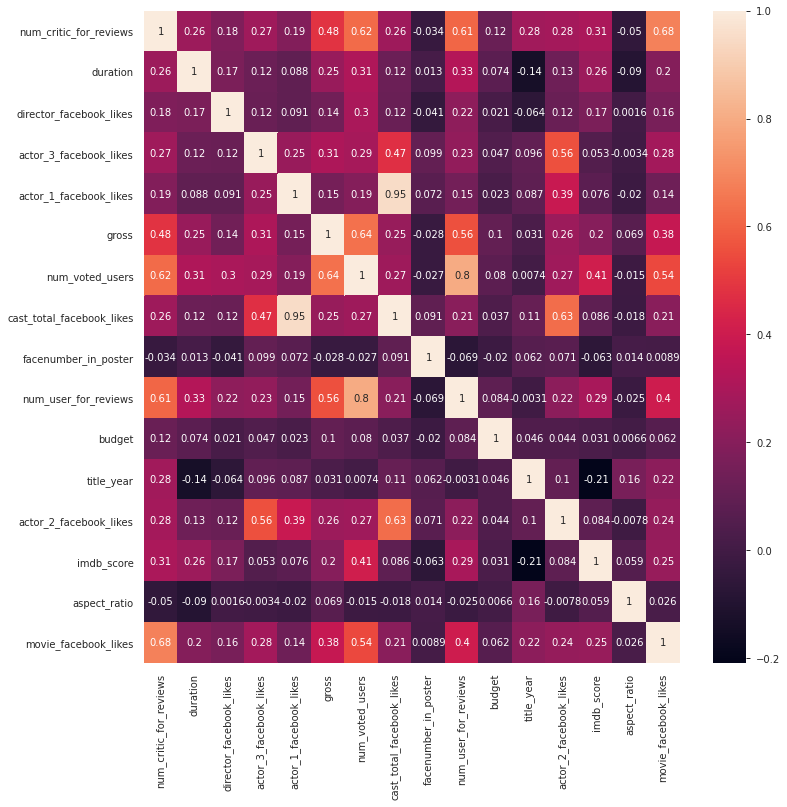

In [4]:
corr_matrix = dataset.corr()
plt.figure(figsize= (12,12))
sns.heatmap(corr_matrix, annot=True)

# Generating an entire report of dataset

In [5]:
#Generating an entire report of dataset
dataset.profile_report()

# Data Cleaning

Removing duplicated values

In [6]:
#Removing duplicated values
dataset.drop_duplicates(subset='movie_title',keep='first',inplace = True)
dataset.shape

(4917, 28)

Checking number of null values in each column

In [7]:
dataset.isnull().sum()

color                         19
director_name                102
num_critic_for_reviews        49
duration                      15
director_facebook_likes      102
actor_3_facebook_likes        23
actor_2_name                  13
actor_1_facebook_likes         7
gross                        863
genres                         0
actor_1_name                   7
movie_title                    0
num_voted_users                0
cast_total_facebook_likes      0
actor_3_name                  23
facenumber_in_poster          13
plot_keywords                152
movie_imdb_link                0
num_user_for_reviews          21
language                      12
country                        5
content_rating               300
budget                       484
title_year                   106
actor_2_facebook_likes        13
imdb_score                     0
aspect_ratio                 326
movie_facebook_likes           0
dtype: int64

Removing all null values in gross since its too much and would affect our prediction in case we fill with other values

In [8]:
dataset = dataset.dropna(axis = 0, subset = ['gross'])
dataset.shape

(4054, 28)

In [9]:
dataset.isnull().sum()

color                          2
director_name                  2
num_critic_for_reviews         3
duration                       2
director_facebook_likes        2
actor_3_facebook_likes        13
actor_2_name                   6
actor_1_facebook_likes         4
gross                          0
genres                         0
actor_1_name                   4
movie_title                    0
num_voted_users                0
cast_total_facebook_likes      0
actor_3_name                  13
facenumber_in_poster           7
plot_keywords                 40
movie_imdb_link                0
num_user_for_reviews           1
language                       3
country                        0
content_rating                63
budget                       265
title_year                     2
actor_2_facebook_likes         6
imdb_score                     0
aspect_ratio                 104
movie_facebook_likes           0
dtype: int64

Removing all null values in budget since its too much and would affect our prediction in case we fill with other values

In [10]:
dataset = dataset.dropna(axis = 0, subset = ['budget'])
dataset.shape

(3789, 28)

In [11]:
dataset.isnull().sum()

color                         2
director_name                 0
num_critic_for_reviews        1
duration                      1
director_facebook_likes       0
actor_3_facebook_likes       10
actor_2_name                  5
actor_1_facebook_likes        3
gross                         0
genres                        0
actor_1_name                  3
movie_title                   0
num_voted_users               0
cast_total_facebook_likes     0
actor_3_name                 10
facenumber_in_poster          6
plot_keywords                31
movie_imdb_link               0
num_user_for_reviews          0
language                      3
country                       0
content_rating               51
budget                        0
title_year                    0
actor_2_facebook_likes        5
imdb_score                    0
aspect_ratio                 74
movie_facebook_likes          0
dtype: int64

In [12]:
dataset.content_rating.unique()

array(['PG-13', 'PG', 'G', 'R', 'Approved', 'NC-17', nan, 'X',
       'Not Rated', 'Unrated', 'M', 'GP', 'Passed'], dtype=object)

Replacing 'Not Rated' in place of null values in content rating

In [13]:
dataset.content_rating.fillna('Not Rated', inplace = True)

Filling color,language,content_rating with most frequent value in column

In [14]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imputer.fit(dataset[['color','language','content_rating']])
dataset[['color','language','content_rating']] = imputer.transform(dataset[['color','language','content_rating']])

In [15]:
dataset.isnull().sum()

color                         0
director_name                 0
num_critic_for_reviews        1
duration                      1
director_facebook_likes       0
actor_3_facebook_likes       10
actor_2_name                  5
actor_1_facebook_likes        3
gross                         0
genres                        0
actor_1_name                  3
movie_title                   0
num_voted_users               0
cast_total_facebook_likes     0
actor_3_name                 10
facenumber_in_poster          6
plot_keywords                31
movie_imdb_link               0
num_user_for_reviews          0
language                      0
country                       0
content_rating                0
budget                        0
title_year                    0
actor_2_facebook_likes        5
imdb_score                    0
aspect_ratio                 74
movie_facebook_likes          0
dtype: int64

Filling numerical columns with median value in column

In [16]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
imputer.fit(dataset[num_cols])
dataset[num_cols] = imputer.transform(dataset[num_cols])

In [17]:
dataset.isnull().sum()

color                         0
director_name                 0
num_critic_for_reviews        0
duration                      0
director_facebook_likes       0
actor_3_facebook_likes        0
actor_2_name                  5
actor_1_facebook_likes        0
gross                         0
genres                        0
actor_1_name                  3
movie_title                   0
num_voted_users               0
cast_total_facebook_likes     0
actor_3_name                 10
facenumber_in_poster          0
plot_keywords                31
movie_imdb_link               0
num_user_for_reviews          0
language                      0
country                       0
content_rating                0
budget                        0
title_year                    0
actor_2_facebook_likes        0
imdb_score                    0
aspect_ratio                  0
movie_facebook_likes          0
dtype: int64

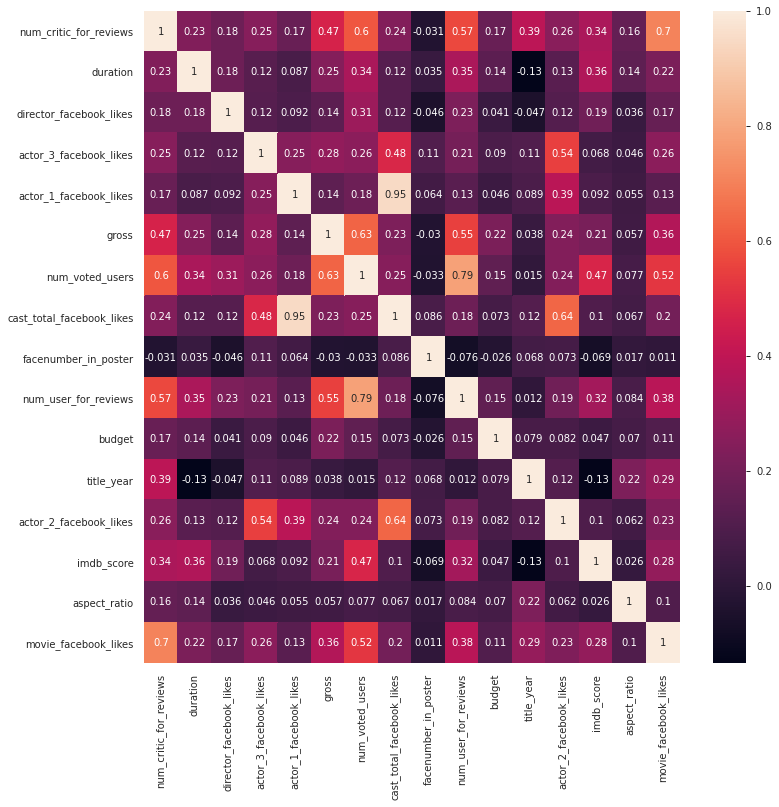

In [18]:
corr_matrix = dataset.corr()
plt.figure(figsize= (12,12))
sns.heatmap(corr_matrix, annot=True)

Removing all categorical columns except genre,color,language,content_rating,country since there are many distinct values and is irrelevant for prediction

In [19]:
dataset = dataset.drop(columns = ['director_name','actor_2_name','actor_1_name','movie_title','actor_3_name','plot_keywords','movie_imdb_link'], axis=1)

In [20]:
dataset.isnull().sum()

color                        0
num_critic_for_reviews       0
duration                     0
director_facebook_likes      0
actor_3_facebook_likes       0
actor_1_facebook_likes       0
gross                        0
genres                       0
num_voted_users              0
cast_total_facebook_likes    0
facenumber_in_poster         0
num_user_for_reviews         0
language                     0
country                      0
content_rating               0
budget                       0
title_year                   0
actor_2_facebook_likes       0
imdb_score                   0
aspect_ratio                 0
movie_facebook_likes         0
dtype: int64

(Optional) To see entire dataset

In [21]:
# #To see entire dataset
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', None)
# pd.set_option('display.width', None)
# pd.set_option('display.max_colwidth', -1)
# pd.options.display.max_rows
# pd.set_option('display.max_rows', None)

# Taking only the top 3 occurances of country, language, content_rating 

In [22]:
top3_country = dataset["country"].value_counts()[:3].index
dataset['country'] = dataset.country.where(dataset.country.isin(top3_country), 'other')

In [23]:
top3_language = dataset["language"].value_counts()[:3].index
dataset['language'] = dataset.language.where(dataset.language.isin(top3_language), 'other')

In [24]:
top3_content_rating = dataset["content_rating"].value_counts()[:3].index
dataset['content_rating'] = dataset.content_rating.where(dataset.content_rating.isin(top3_content_rating), 'other')

# Resetting index

In [25]:
dataset.reset_index(inplace = True, drop = True)

# Getting unique values in genre

In [26]:
#Getting unique values in genre
genre = dataset.iloc[:, dataset.columns.get_loc('genres')].values
a = []
unique = [x.split('|') for x in genre]
for x in unique:
    for y in x:
        a.append(y)
a = set(a)

# Creating null columns for all unique values

In [27]:
#Creating null columns for all unique values
for x in a:
    dataset[x] = np.nan

In [28]:
#Encoding the data in the form of 0's and 1's
for x in a:
    for i in range(0,len(dataset)):
        if x in unique[i]:
            dataset[x][i] = 1
        else:
            dataset[x][i] = 0

/home/jainam/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/home/jainam/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


# Removing column genre 

In [29]:
dataset = dataset.drop(columns = ['genres'], axis=1)

# Encoding color,language,content_rating,country

In [30]:
dataset = pd.get_dummies(dataset, columns=['color'], prefix = ['color'])

In [31]:
dataset = pd.get_dummies(dataset, columns=['language'], prefix = ['language'])

In [32]:
dataset = pd.get_dummies(dataset, columns=['content_rating'], prefix = ['content_rating'])

In [33]:
dataset = pd.get_dummies(dataset, columns=['country'], prefix = ['country'])

In [34]:
dataset.head()

,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,...,language_Spanish,language_other,content_rating_PG,content_rating_PG-13,content_rating_R,content_rating_other,country_France,country_UK,country_USA,country_other
0,723.0,178.0,0.0,855.0,1000.0,760505847.0,886204.0,4834.0,0.0,3054.0,...,0,0,0,1,0,0,0,0,1,0
1,302.0,169.0,563.0,1000.0,40000.0,309404152.0,471220.0,48350.0,0.0,1238.0,...,0,0,0,1,0,0,0,0,1,0
2,602.0,148.0,0.0,161.0,11000.0,200074175.0,275868.0,11700.0,1.0,994.0,...,0,0,0,1,0,0,0,1,0,0
3,813.0,164.0,22000.0,23000.0,27000.0,448130642.0,1144337.0,106759.0,0.0,2701.0,...,0,0,0,1,0,0,0,0,1,0
4,462.0,132.0,475.0,530.0,640.0,73058679.0,212204.0,1873.0,1.0,738.0,...,0,0,0,1,0,0,0,0,1,0


# Defining Matrix of Features

In [35]:
#Defining Matrix of Features
X = dataset.iloc[:,dataset.columns != 'imdb_score'].values

# Defining matrix of dependent variable

In [36]:
#Defining matrix of dependent variable
y = dataset.iloc[:,dataset.columns.get_loc('imdb_score')].values

# Splitting into training and test set

In [37]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3,random_state = 29)

# Training the model

Random Forest Regression(Since it gives maximum accuracy)

In [38]:
#Random Forest Regression
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 500, random_state=12)
regressor.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=500, n_jobs=None, oob_score=False,
                      random_state=12, verbose=0, warm_start=False)

# Evaluating the model

Predicting the output

In [39]:
y_pred = regressor.predict(X_test)

Finding accuracy of the model

In [40]:
score = regressor.score(X_test, y_test)
print(f'Accuracy: {score*100}%')

Accuracy: 64.04171557671773%


In [41]:
rss=((y_test-y_pred)**2).sum()
mse=np.mean((y_test-y_pred)**2)
print("Final rmse value is =",np.sqrt(np.mean((y_test-y_pred)**2)))

Final rmse value is = 0.6328224954778086


Predicted IMDB rating for few random samples in the dataset

In [42]:
import random
print(f'Actual Value  |  Predicted Value')
print('---------------------------------')
for x in range(0,10):
    num = random.randint(0,100)
    print(f'   {y_test[num]}        |      {y_pred[num]:.1f}')

Actual Value  |  Predicted Value
---------------------------------
   5.3        |      5.1
   7.6        |      7.2
   6.7        |      6.5
   7.2        |      7.4
   6.9        |      6.9
   5.8        |      5.4
   5.4        |      6.5
   6.9        |      6.1
   5.5        |      6.0
   6.9        |      6.1
